<a href="https://colab.research.google.com/github/Gkcoli/CCADMACL_EXAM_COM222-ML/blob/main/Midterm_Exam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
import numpy as np
import pandas as pd
import seaborn as sns

from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler

from collections import Counter

In [5]:
face_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/face.csv?raw=true")
chrome_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/chrome.csv?raw=true")
lines2_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/lines2.csv?raw=true")
supernova_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/supernova.csv?raw=true")
network_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/network.csv?raw=true")
spirals_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/7a460f9db1109ede93e371e663bac0615057de89/dataset/spirals.csv?raw=true")
densedisk_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/densedisk.csv?raw=true")
rings_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/rings.csv?raw=true")
chainlink_df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXAM/blob/b6a2e277c58bd723f9c4c1a2873aac30b87f778b/dataset/chainlink.csv?raw=true")


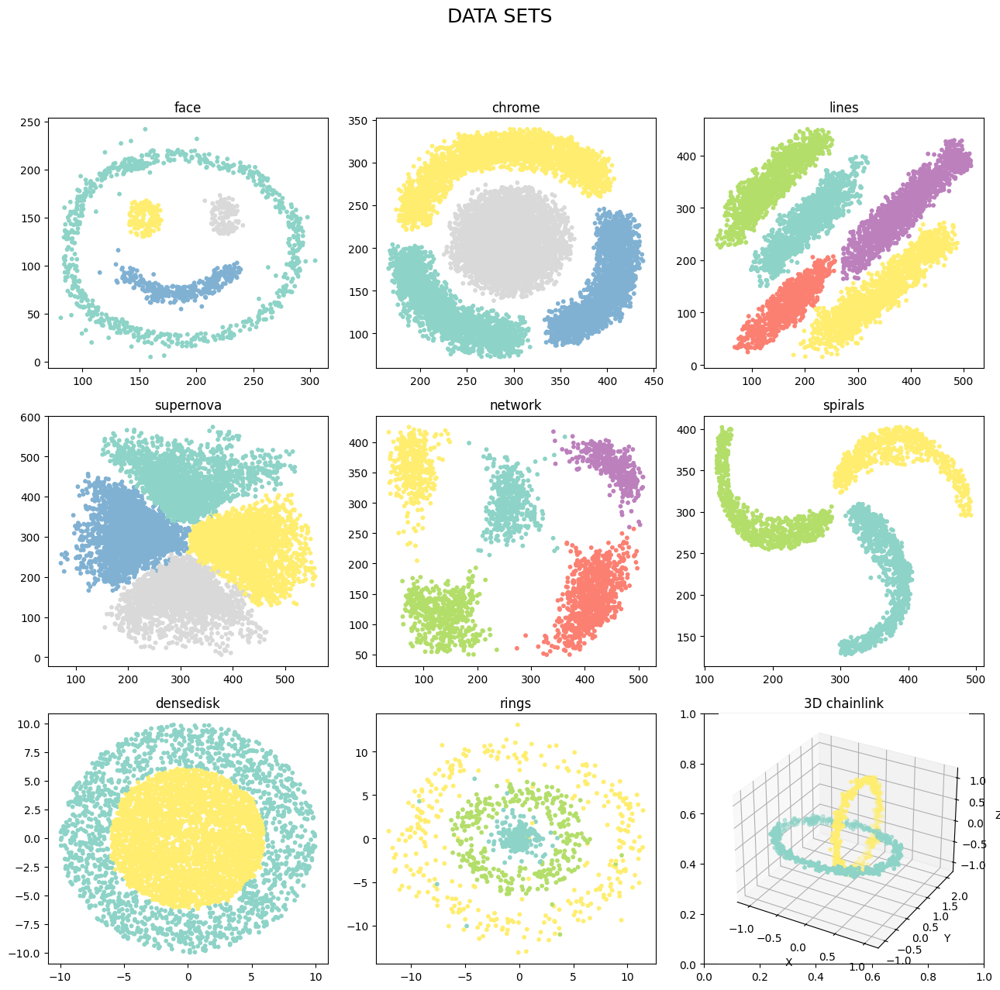

In [6]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(13, 13))
fig.suptitle('DATA SETS\n', size=18)

# Plot the 2D scatterplots
axes[0, 0].scatter(face_df['x'], face_df['y'], c=face_df['color'], s=10, cmap="Set3")
axes[0, 0].set_title("face")

axes[0, 1].scatter(chrome_df['x'], chrome_df['y'], c=chrome_df['color'], s=10, cmap="Set3")
axes[0, 1].set_title("chrome")

axes[0, 2].scatter(lines2_df['x'], lines2_df['y'], c=lines2_df['color'], s=10, cmap="Set3")
axes[0, 2].set_title("lines")

axes[1, 0].scatter(supernova_df['x'], supernova_df['y'], c=supernova_df['color'], s=10, cmap="Set3")
axes[1, 0].set_title("supernova")

axes[1, 1].scatter(network_df['x'], network_df['y'], c=network_df['color'], s=10, cmap="Set3")
axes[1, 1].set_title("network")

axes[1, 2].scatter(spirals_df['x'], spirals_df['y'], c=spirals_df['color'], s=10, cmap="Set3")
axes[1, 2].set_title("spirals")

axes[2, 0].scatter(densedisk_df['x'], densedisk_df['y'], c=densedisk_df['color'], s=10, cmap="Set3") # Use densedisk_df instead of densedisk
axes[2, 0].set_title("densedisk")

axes[2, 1].scatter(rings_df['x'], rings_df['y'], c=rings_df['color'], s=10, cmap="Set3")
axes[2, 1].set_title("rings")

# Add a 3D plot
ax3d = fig.add_subplot(3, 3, 9, projection='3d')
ax3d.scatter(chainlink_df['x'], chainlink_df['y'], chainlink_df['z'], c=chainlink_df['color'], cmap="Set3", s=10)
ax3d.set_title("3D chainlink")
ax3d.set_xlabel("X")
ax3d.set_ylabel("Y")
ax3d.set_zlabel("Z")

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])

# A. Use K-means to cluster each dataset


1. Create each copy of the dataset for k-means


In [7]:
datasets = {
    'face': face_df,
    'chrome': chrome_df,
    'lines2': lines2_df,
    'supernova': supernova_df,
    'network': network_df,
    'spirals': spirals_df,
    'densedisk': densedisk_df,
    'rings': rings_df,
    'chainlink': chainlink_df
}

<ipython-input-8-0fa1c0ad92a5>:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  kmeans_cmap = plt.cm.get_cmap("Set3")
<ipython-input-8-0fa1c0ad92a5>:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  kmeans_cmap = plt.cm.get_cmap("Set3")
<ipython-input-8-0fa1c0ad92a5>:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  kmeans_cmap = plt.cm.get_cmap("Set3")
<ipython-input-8-0fa1c0ad92a5>:36: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matp

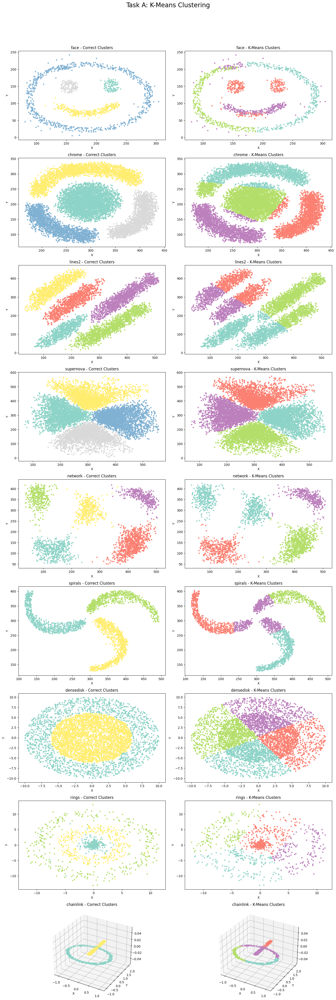

In [8]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import numpy as np

# Task A: K-Means Clustering
fig = plt.figure(figsize=(15, len(datasets) * 5))
fig.suptitle('Task A: K-Means Clustering', size=20)

for i, (name, df) in enumerate(datasets.items()):
    # Create a subplot for each dataset
    if name == 'chainlink':
        ax = fig.add_subplot(len(datasets), 2, 2 * i + 1, projection='3d')  # Correct clusters
        ax_kmeans = fig.add_subplot(len(datasets), 2, 2 * i + 2, projection='3d')  # KMeans clusters
    else:
        ax = fig.add_subplot(len(datasets), 2, 2 * i + 1)  # Correct clusters
        ax_kmeans = fig.add_subplot(len(datasets), 2, 2 * i + 2)  # KMeans clusters

    # 1. Create a copy of the dataset
    dataset = df.copy()

    # 2. Drop the "color" column for KMeans clustering
    features = dataset.drop(columns=["color"])

    # 3. Train a K-Means model
    kmeans = KMeans(n_clusters=4, random_state=42)
    dataset['KMeans_Cluster'] = kmeans.fit_predict(features)

    # 4. Plot the correct clusters
    # Ensure the 'color' column is numerical for correct plotting
    scatter = ax.scatter(df['x'], df['y'], c=pd.factorize(df['color'])[0], cmap="Set3", s=10)
    ax.set_title(f"{name} - Correct Clusters")
    ax.set_xlabel("X")
    ax.set_ylabel("Y")

    # 5. Plot the K-Means clusters with the same colors
    kmeans_cmap = plt.cm.get_cmap("Set3")
    kmeans_colors = kmeans_cmap(dataset['KMeans_Cluster'] / 4)  # Normalize the cluster values for color

    # Plot the K-Means clusters using the correct colors
    if name == 'chainlink':
        ax_kmeans.scatter(df['x'], df['y'], c=kmeans_colors, s=10, marker='o')
    else:
        ax_kmeans.scatter(df['x'], df['y'], c=kmeans_colors, s=10)

    ax_kmeans.set_title(f"{name} - K-Means Clusters")
    ax_kmeans.set_xlabel("X")
    ax_kmeans.set_ylabel("Y")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


# B. Use Agglomerative Clustering to cluster each dataset


1. Create each copy of the dataset for Agglomerative Clustering


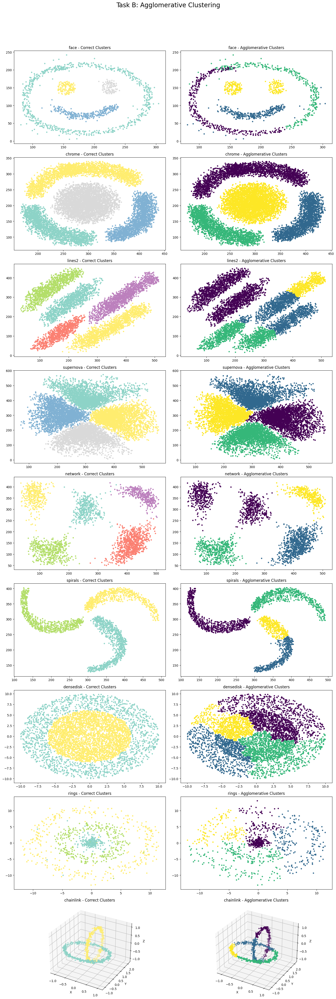

In [9]:
# Task B: Agglomerative Clustering
fig = plt.figure(figsize=(15, len(datasets) * 5))
fig.suptitle('Task B: Agglomerative Clustering', size=20)

for i, (name, df) in enumerate(datasets.items()):
    # Create a subplot for each dataset
    if name == 'chainlink':
        ax = fig.add_subplot(len(datasets), 2, 2 * i + 1, projection='3d')  # Correct clusters
        ax_agglo = fig.add_subplot(len(datasets), 2, 2 * i + 2, projection='3d')  # Agglomerative clusters
    else:
        ax = fig.add_subplot(len(datasets), 2, 2 * i + 1)  # Correct clusters
        ax_agglo = fig.add_subplot(len(datasets), 2, 2 * i + 2)  # Agglomerative clusters

    # 1. Create a copy of the dataset
    dataset = df.copy()

    # 2. Drop the "color" column
    features = dataset.drop(columns=["color"])

    # 3. Train an Agglomerative Clustering model
    agglo = AgglomerativeClustering(n_clusters=4)
    dataset['Agglo_Cluster'] = agglo.fit_predict(features)

    # 4. Plot the correct clusters
    if name == 'chainlink':
        ax.scatter(df['x'], df['y'], df['z'], c=df['color'], cmap="Set3", s=10)
        ax.set_title(f"{name} - Correct Clusters")
        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        ax.set_zlabel("Z")
    else:
        ax.scatter(df['x'], df['y'], c=df['color'], cmap="Set3", s=10)
        ax.set_title(f"{name} - Correct Clusters")

    # 5. Plot the Agglomerative clusters
    if name == 'chainlink':
        ax_agglo.scatter(df['x'], df['y'], df['z'], c=dataset['Agglo_Cluster'], cmap="viridis", s=10)
        ax_agglo.set_title(f"{name} - Agglomerative Clusters")
        ax_agglo.set_xlabel("X")
        ax_agglo.set_ylabel("Y")
        ax_agglo.set_zlabel("Z")
    else:
        ax_agglo.scatter(df['x'], df['y'], c=dataset['Agglo_Cluster'], cmap="viridis", s=10)
        ax_agglo.set_title(f"{name} - Agglomerative Clusters")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


# C. Use DBSCAN to cluster each dataset


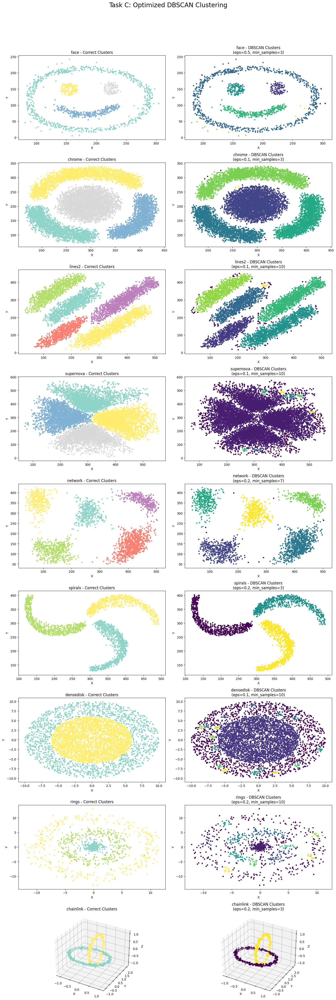

In [22]:
from sklearn.metrics import adjusted_rand_score

# Function to tune DBSCAN parameters and match original clusters
def optimize_dbscan(features, true_labels):
    best_eps = 0.1
    best_min_samples = 2
    best_score = -1
    best_labels = None

    # Parameter grid for tuning
    eps_values = [0.1, 0.2, 0.3, 0.4, 0.5]
    min_samples_values = [3, 5, 7, 10]

    for eps in eps_values:
        for min_samples in min_samples_values:
            dbscan = DBSCAN(eps=eps, min_samples=min_samples).fit(features)
            cluster_labels = dbscan.labels_

            # Ignore cases where DBSCAN assigns all to a single cluster
            if len(set(cluster_labels)) <= 1:
                continue

            # Adjusted Rand Index (ARI) for comparison with ground truth
            score = adjusted_rand_score(true_labels, cluster_labels)
            if score > best_score:
                best_score = score
                best_eps = eps
                best_min_samples = min_samples
                best_labels = cluster_labels

    return best_eps, best_min_samples, best_labels, best_score


fig = plt.figure(figsize=(15, len(datasets) * 5))
fig.suptitle('Task C: Optimized DBSCAN Clustering', size=20)

for i, (name, df) in enumerate(datasets.items()):
    is_3d = name == 'chainlink'

    # Prepare subplots: Correct and DBSCAN Clusters
    ax_correct = fig.add_subplot(len(datasets), 2, 2 * i + 1, projection='3d' if is_3d else None)
    ax_dbscan = fig.add_subplot(len(datasets), 2, 2 * i + 2, projection='3d' if is_3d else None)

    # Preprocessing
    dataset = df.copy()
    features = dataset.drop(columns=["color"])
    true_labels = dataset["color"]  # Ground truth for comparison

    scaler = StandardScaler()
    scaled_features = scaler.fit_transform(features)

    # Optimize DBSCAN
    best_eps, best_min_samples, best_labels, best_score = optimize_dbscan(scaled_features, true_labels)
    dataset['DBSCAN_Cluster'] = best_labels

    # Plot Correct Clusters
    if is_3d:
        ax_correct.scatter(df['x'], df['y'], df['z'], c=true_labels, cmap="Set3", s=10)
        ax_correct.set_xlabel("X")
        ax_correct.set_ylabel("Y")
        ax_correct.set_zlabel("Z")
    else:
        ax_correct.scatter(df['x'], df['y'], c=true_labels, cmap="Set3", s=10)
        ax_correct.set_xlabel("X")
        ax_correct.set_ylabel("Y")
    ax_correct.set_title(f"{name} - Correct Clusters")

    # Plot Optimized DBSCAN Clusters
    if is_3d:
        ax_dbscan.scatter(df['x'], df['y'], df['z'], c=dataset['DBSCAN_Cluster'], cmap="viridis", s=10)
        ax_dbscan.set_xlabel("X")
        ax_dbscan.set_ylabel("Y")
        ax_dbscan.set_zlabel("Z")
    else:
        ax_dbscan.scatter(df['x'], df['y'], c=dataset['DBSCAN_Cluster'], cmap="viridis", s=10)
        ax_dbscan.set_xlabel("X")
        ax_dbscan.set_ylabel("Y")
    ax_dbscan.set_title(f"{name} - DBSCAN Clusters\n(eps={best_eps}, min_samples={best_min_samples})")

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# D. Compare all algorithms
1. Display the Correct cluster, K-means cluster, Agglomerative cluster and DBSCAN cluster in a single plot.


*  Each row should contain each dataset
* Each column should contain each the correct cluster, k-means cluster, agglomerative cluster and DBSCAN cluster.





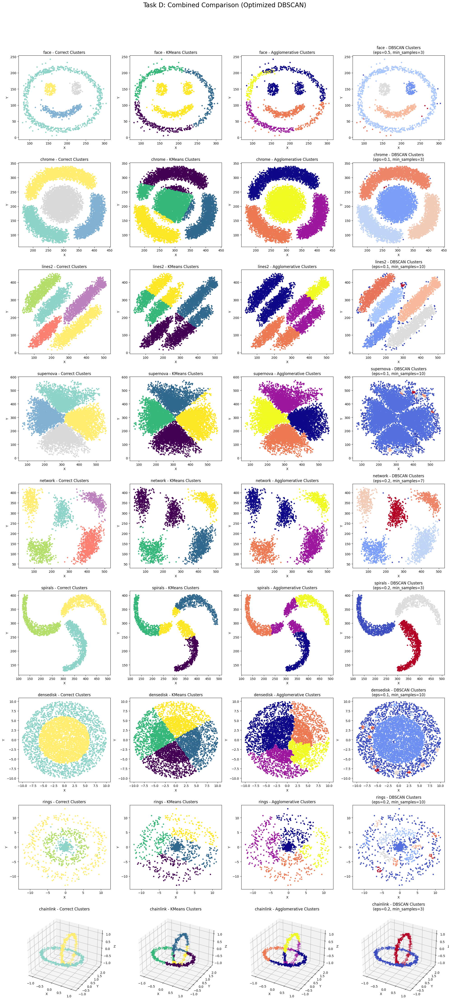

In [25]:
from sklearn.metrics import adjusted_rand_score

# Function to tune DBSCAN parameters and match original clusters
def optimize_dbscan(features, true_labels):
    best_eps = 0.1
    best_min_samples = 2
    best_score = -1
    best_labels = None

    # Parameter grid for tuning
    eps_values = [0.1, 0.2, 0.3, 0.4, 0.5]
    min_samples_values = [3, 5, 7, 10]

    for eps in eps_values:
        for min_samples in min_samples_values:
            dbscan = DBSCAN(eps=eps, min_samples=min_samples).fit(features)
            cluster_labels = dbscan.labels_

            # Ignore cases where DBSCAN assigns all to a single cluster
            if len(set(cluster_labels)) <= 1:
                continue

            # Adjusted Rand Index (ARI) for comparison with ground truth
            score = adjusted_rand_score(true_labels, cluster_labels)
            if score > best_score:
                best_score = score
                best_eps = eps
                best_min_samples = min_samples
                best_labels = cluster_labels

    return best_eps, best_min_samples, best_labels, best_score


fig = plt.figure(figsize=(20, len(datasets) * 5))
fig.suptitle('Task D: Combined Comparison (Optimized DBSCAN)', size=20)

for i, (name, df) in enumerate(datasets.items()):
    is_3d = name == 'chainlink'

    # Prepare subplots: Correct, KMeans, Agglomerative, and DBSCAN
    ax_correct = fig.add_subplot(len(datasets), 4, 4 * i + 1, projection='3d' if is_3d else None)
    ax_kmeans = fig.add_subplot(len(datasets), 4, 4 * i + 2, projection='3d' if is_3d else None)
    ax_agglo = fig.add_subplot(len(datasets), 4, 4 * i + 3, projection='3d' if is_3d else None)
    ax_dbscan = fig.add_subplot(len(datasets), 4, 4 * i + 4, projection='3d' if is_3d else None)

    # Preprocessing
    dataset = df.copy()
    features = dataset.drop(columns=["color"])
    true_labels = dataset["color"]  # Ground truth for comparison

    scaler = StandardScaler()
    scaled_features = scaler.fit_transform(features)

    # KMeans Clustering
    kmeans = KMeans(n_clusters=4, random_state=42)
    dataset['KMeans_Cluster'] = kmeans.fit_predict(scaled_features)

    # Agglomerative Clustering
    agglo = AgglomerativeClustering(n_clusters=4)
    dataset['Agglo_Cluster'] = agglo.fit_predict(scaled_features)

    # Optimized DBSCAN
    best_eps, best_min_samples, best_labels, best_score = optimize_dbscan(scaled_features, true_labels)
    dataset['DBSCAN_Cluster'] = best_labels

    # Plot Correct Clusters
    if is_3d:
        ax_correct.scatter(df['x'], df['y'], df['z'], c=true_labels, cmap="Set3", s=10)
        ax_correct.set_xlabel("X")
        ax_correct.set_ylabel("Y")
        ax_correct.set_zlabel("Z")
    else:
        ax_correct.scatter(df['x'], df['y'], c=true_labels, cmap="Set3", s=10)
        ax_correct.set_xlabel("X")
        ax_correct.set_ylabel("Y")
    ax_correct.set_title(f"{name} - Correct Clusters")

    # Plot KMeans Clusters
    if is_3d:
        ax_kmeans.scatter(df['x'], df['y'], df['z'], c=dataset['KMeans_Cluster'], cmap="viridis", s=10)
        ax_kmeans.set_xlabel("X")
        ax_kmeans.set_ylabel("Y")
        ax_kmeans.set_zlabel("Z")
    else:
        ax_kmeans.scatter(df['x'], df['y'], c=dataset['KMeans_Cluster'], cmap="viridis", s=10)
        ax_kmeans.set_xlabel("X")
        ax_kmeans.set_ylabel("Y")
    ax_kmeans.set_title(f"{name} - KMeans Clusters")

    # Plot Agglomerative Clusters
    if is_3d:
        ax_agglo.scatter(df['x'], df['y'], df['z'], c=dataset['Agglo_Cluster'], cmap="plasma", s=10)
        ax_agglo.set_xlabel("X")
        ax_agglo.set_ylabel("Y")
        ax_agglo.set_zlabel("Z")
    else:
        ax_agglo.scatter(df['x'], df['y'], c=dataset['Agglo_Cluster'], cmap="plasma", s=10)
        ax_agglo.set_xlabel("X")
        ax_agglo.set_ylabel("Y")
    ax_agglo.set_title(f"{name} - Agglomerative Clusters")

    # Plot DBSCAN Clusters
    if is_3d:
        ax_dbscan.scatter(df['x'], df['y'], df['z'], c=dataset['DBSCAN_Cluster'], cmap="coolwarm", s=10)
        ax_dbscan.set_xlabel("X")
        ax_dbscan.set_ylabel("Y")
        ax_dbscan.set_zlabel("Z")
    else:
        ax_dbscan.scatter(df['x'], df['y'], c=dataset['DBSCAN_Cluster'], cmap="coolwarm", s=10)
        ax_dbscan.set_xlabel("X")
        ax_dbscan.set_ylabel("Y")
    ax_dbscan.set_title(f"{name} - DBSCAN Clusters\n(eps={best_eps}, min_samples={best_min_samples})")

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()
